In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from dataset import *
from save_load import *
from NN_library.PINN import *
from NN_library.train_basis import *
from matplotlib.tri import Triangulation
%load_ext autoreload
%autoreload 2

Using device: cuda


In [3]:
data = dataset_grid(129, [0, 2*np.pi], [0, 2*np.pi])
loaders = get_loaders_Sobol(data, 129**2)

In [4]:
L = 2*np.pi
N = 512 # number of nodes in each direction including the border
x = np.linspace(0, L, N, endpoint=True)
y = np.linspace(0, L, N, endpoint=True)

XY = np.meshgrid(x, y)
grid_data = torch.tensor(np.vstack((XY[0].flatten(), XY[1].flatten())).T, dtype=torch.float, device=dev)

# Test functions

## NN-based

In [13]:
N_test = 50
torch.manual_seed(0)
test_functions = [PINN(n_periodic=2, n_hidden=4, n_layers=1, period_len=L).to(dev) for i in range(N_test)]
total_params = sum(p.numel() for p in test_functions[0].parameters())
args = {'lr' : 1e-4, 'epochs' : 10000, 'dev' : dev, 'name' : f'NN_library/basis/{total_params}_{N_test}'}

In [14]:
for i in range(N_test):
    test_functions[i] = load_network(test_functions[i], args['name'] + f'_{i}', args)

In [15]:
losses_train = train_basis(loaders, args, test_functions)

Epoch: 0 mean train loss:  4.64384174e+00
Epoch: 1 mean train loss:  4.64278746e+00
Epoch: 2 mean train loss:  4.64173746e+00
Epoch: 3 mean train loss:  4.64068937e+00
Epoch: 4 mean train loss:  4.63964319e+00
Epoch: 5 mean train loss:  4.63859749e+00
Epoch: 6 mean train loss:  4.63755369e+00
Epoch: 7 mean train loss:  4.63651037e+00
Epoch: 8 mean train loss:  4.63546944e+00
Epoch: 9 mean train loss:  4.63442898e+00
Epoch: 10 mean train loss:  4.63339043e+00
Epoch: 11 mean train loss:  4.63235283e+00
Epoch: 12 mean train loss:  4.63131523e+00
Epoch: 13 mean train loss:  4.63027859e+00
Epoch: 14 mean train loss:  4.62924290e+00
Epoch: 15 mean train loss:  4.62820721e+00
Epoch: 16 mean train loss:  4.62717295e+00
Epoch: 17 mean train loss:  4.62613869e+00
Epoch: 18 mean train loss:  4.62510538e+00
Epoch: 19 mean train loss:  4.62407303e+00
Epoch: 20 mean train loss:  4.62304068e+00
Epoch: 21 mean train loss:  4.62200928e+00
Epoch: 22 mean train loss:  4.62097788e+00
Epoch: 23 mean train 

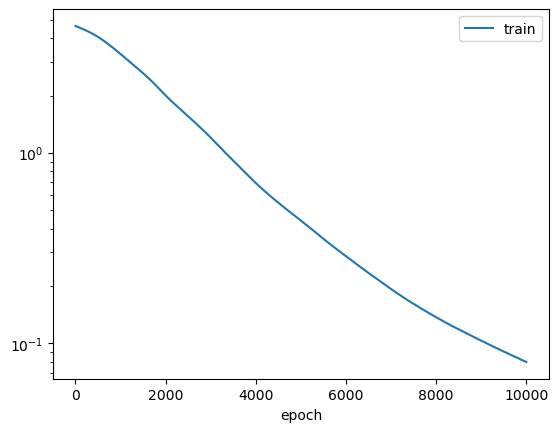

In [16]:
plt.plot(losses_train)
plt.xlabel('epoch')
plt.legend(['train', 'validation'])
plt.yscale('log')

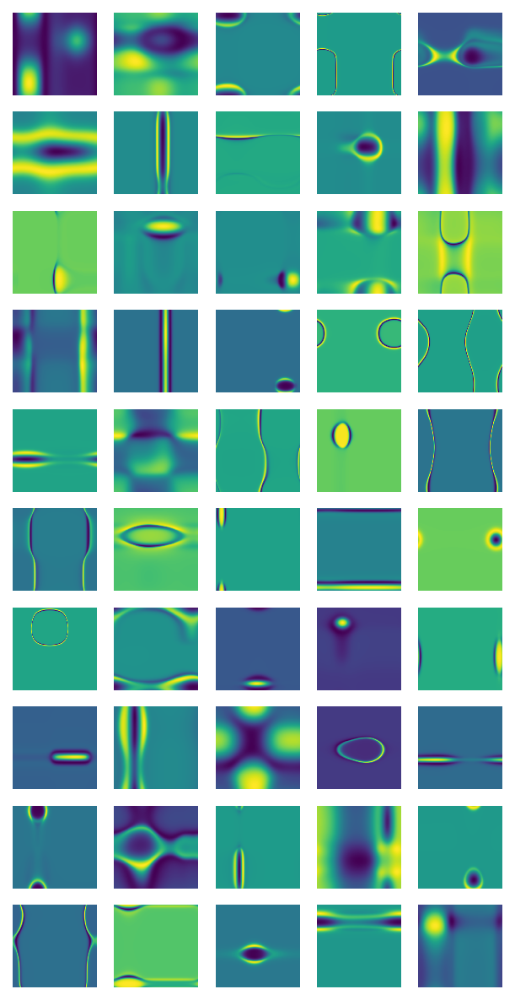

In [17]:
fig, axs = plt.subplots(nrows=10, ncols=N_test//10, figsize=(N_test//10,10), dpi=150)
for i in range(len(test_functions)):
    axs.flat[i].pcolormesh(XY[0], XY[1], test_functions[i](grid_data).reshape(N, N).cpu().detach())
    axs.flat[i].set_axis_off()

In [5]:
# compute G if needed
for i, x in enumerate(loaders['train']):
    areas, tri = get_areas(x)
    areas = areas.to(dev)
x = x.to(dev).requires_grad_(True)

G = torch.zeros((N_test, N_test))
g_test = []
for i in range(N_test):
    y_test = test_functions[i](x)
    grad_test = torch.autograd.grad(
                outputs=y_test, inputs=x,
                grad_outputs=torch.ones_like(y_test)
            )[0]
    g_test.append(grad_test.detach())

#for i in range(N_test):
    #for j in range(i, N_test):
        #intgr = compute_int(areas, tri, g_test[i], g_test[j])
        #G[i,j] = intgr
        #G[j,i] = intgr

for i in range(N_test):
        intgr = compute_int(areas, tri, g_test[i], g_test[i])
        G[i,i] = intgr

torch.save(G, "G_primal_65.pt")
G_inv = torch.linalg.inv(G).to(dev)

In [5]:
G = torch.load("G_primal_65.pt")[:N_test,:N_test]
G_inv = torch.linalg.inv(G).to(dev)

In [ ]:
losses_train, losses_val = train_primal(net_primal, loaders, args, A, H1, test_functions, G_inv, L)

Epoch: 0 mean train loss:  3.23157272e+01, mean val. loss:  7.71011949e-01
Epoch: 1 mean train loss:  3.22805252e+01, mean val. loss:  7.70982862e-01
Epoch: 2 mean train loss:  3.22452736e+01, mean val. loss:  7.70953655e-01
Epoch: 3 mean train loss:  3.22099762e+01, mean val. loss:  7.70924389e-01
Epoch: 4 mean train loss:  3.21746368e+01, mean val. loss:  7.70895004e-01
Epoch: 5 mean train loss:  3.21392479e+01, mean val. loss:  7.70865738e-01
Epoch: 6 mean train loss:  3.21038132e+01, mean val. loss:  7.70836294e-01
Epoch: 7 mean train loss:  3.20683289e+01, mean val. loss:  7.70806730e-01
Epoch: 8 mean train loss:  3.20328026e+01, mean val. loss:  7.70777225e-01
Epoch: 9 mean train loss:  3.19972210e+01, mean val. loss:  7.70747602e-01
Epoch: 10 mean train loss:  3.19615898e+01, mean val. loss:  7.70717978e-01
Epoch: 11 mean train loss:  3.19259071e+01, mean val. loss:  7.70688295e-01
Epoch: 12 mean train loss:  3.18901768e+01, mean val. loss:  7.70658493e-01
Epoch: 13 mean train l

# Primal PINN

In [ ]:
net_primal = PINN(n_periodic=2, n_hidden=4, n_layers=1, period_len=L)
total_params = sum(p.numel() for p in net_primal.parameters())
print(f"Number of parameters: {total_params}")


Number of parameters: 65


In [ ]:
net_primal = load_network(net_primal, args['name']+'_39999', args)
net_primal = net_primal.to(dev)

In [ ]:
losses_train, losses_val = train_primal(net_primal, loaders, args, A, H1, test_functions, G_inv, L)

Epoch: 0 mean train loss:  3.23157272e+01, mean val. loss:  7.71011949e-01
Epoch: 1 mean train loss:  3.22805252e+01, mean val. loss:  7.70982862e-01
Epoch: 2 mean train loss:  3.22452736e+01, mean val. loss:  7.70953655e-01
Epoch: 3 mean train loss:  3.22099762e+01, mean val. loss:  7.70924389e-01
Epoch: 4 mean train loss:  3.21746368e+01, mean val. loss:  7.70895004e-01
Epoch: 5 mean train loss:  3.21392479e+01, mean val. loss:  7.70865738e-01
Epoch: 6 mean train loss:  3.21038132e+01, mean val. loss:  7.70836294e-01
Epoch: 7 mean train loss:  3.20683289e+01, mean val. loss:  7.70806730e-01
Epoch: 8 mean train loss:  3.20328026e+01, mean val. loss:  7.70777225e-01
Epoch: 9 mean train loss:  3.19972210e+01, mean val. loss:  7.70747602e-01
Epoch: 10 mean train loss:  3.19615898e+01, mean val. loss:  7.70717978e-01
Epoch: 11 mean train loss:  3.19259071e+01, mean val. loss:  7.70688295e-01
Epoch: 12 mean train loss:  3.18901768e+01, mean val. loss:  7.70658493e-01
Epoch: 13 mean train l

In [14]:
np.save(f'NN_library/training_data/square/VNPINN_primal_{total_params}_{N_test}', np.vstack([losses_train, losses_val]))

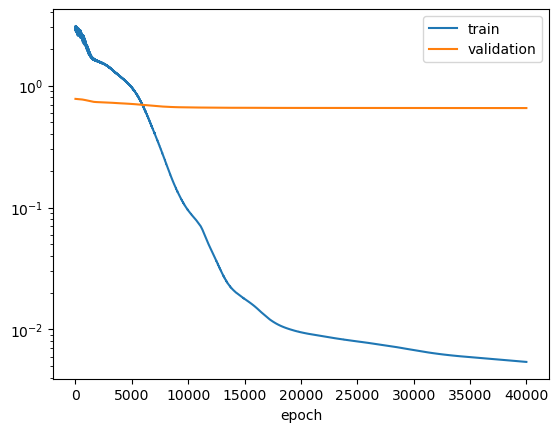

In [13]:
plt.plot(losses_train)
plt.plot(losses_val)
plt.xlabel('epoch')
plt.legend(['train', 'validation'])
plt.yscale('log')

In [ ]:
U1 = net_primal(grid_data).detach().cpu()
error_1, _ = PDE_loss(grid_data, net_primal, A, H1)

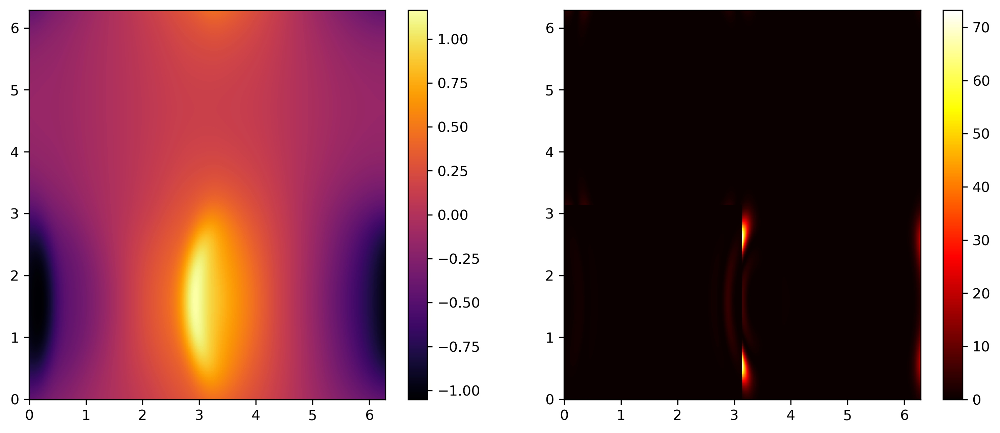

In [16]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], U1.reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], error_1.detach().cpu().reshape(N, N), cmap='hot')
fig.colorbar(pos2, ax=axs[1])

In [17]:
for i, x in enumerate(loaders['train']):
    areas, tri = get_areas(x)
    areas = areas.to(args['dev'])
x = x.to(args['dev'])

_, q = PDE_loss(x, net_primal, A, H1)
bound = compute_bound(areas, tri, q, L).detach()[0].item()
print(bound)

np.save(f'bounds/square/A_u_VNPINN_{total_params}_{N_test}.npy', bound)

0.6546745896339417


# Dual PINN

In [19]:
net_dual = PINN(n_periodic=2, n_hidden=4, n_layers=1, period_len=L)
total_params = sum(p.numel() for p in net_dual.parameters())
print(f"Number of parameters: {total_params}")
args = {'lr' : 0.0001, 'epochs' : 40000, 'dev' : dev, 'name' : f'NN_library/VPINN/square/VNPINN_dual_{total_params}_{N_test}'}

Number of parameters: 65


In [7]:
net_dual = load_network(net_dual, args['name']+'_39999', args)
net_dual = net_dual.to(dev)

In [20]:
losses_train, losses_val = train_dual(net_dual, loaders, args, A_inv, H1, test_functions, G_inv, L)

Epoch: 0 mean train loss:  2.64097229e+02, mean val. loss:  3.07841897e-01
Epoch: 1 mean train loss:  2.66058929e+02, mean val. loss:  3.07843506e-01
Epoch: 2 mean train loss:  2.60778473e+02, mean val. loss:  3.07845056e-01
Epoch: 3 mean train loss:  2.64660950e+02, mean val. loss:  3.07846606e-01
Epoch: 4 mean train loss:  2.61746765e+02, mean val. loss:  3.07848155e-01
Epoch: 5 mean train loss:  2.67976990e+02, mean val. loss:  3.07849735e-01
Epoch: 6 mean train loss:  2.68210083e+02, mean val. loss:  3.07851255e-01
Epoch: 7 mean train loss:  2.62245605e+02, mean val. loss:  3.07852745e-01
Epoch: 8 mean train loss:  2.61678864e+02, mean val. loss:  3.07854265e-01
Epoch: 9 mean train loss:  2.66313934e+02, mean val. loss:  3.07855785e-01
Epoch: 10 mean train loss:  2.69069977e+02, mean val. loss:  3.07857275e-01
Epoch: 11 mean train loss:  2.65194855e+02, mean val. loss:  3.07858765e-01
Epoch: 12 mean train loss:  2.61146606e+02, mean val. loss:  3.07860285e-01
Epoch: 13 mean train l

In [22]:
np.save(f'NN_library/training_data/square/VNPINN_dual_{total_params}_{N_test}', np.vstack([losses_train, losses_val]))

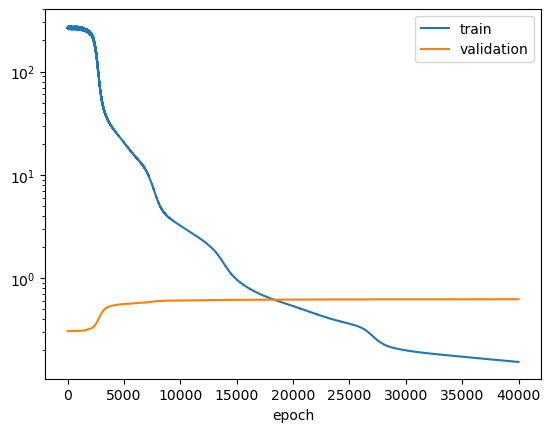

In [21]:
plt.plot(losses_train)
plt.plot(losses_val)
plt.xlabel('epoch')
plt.legend(['train', 'validation'])
plt.yscale('log')

In [ ]:
U2 = net_dual(grid_data).detach().cpu()
error_2, _ = PDE_loss_dual(grid_data, net_dual, A_inv, H1)

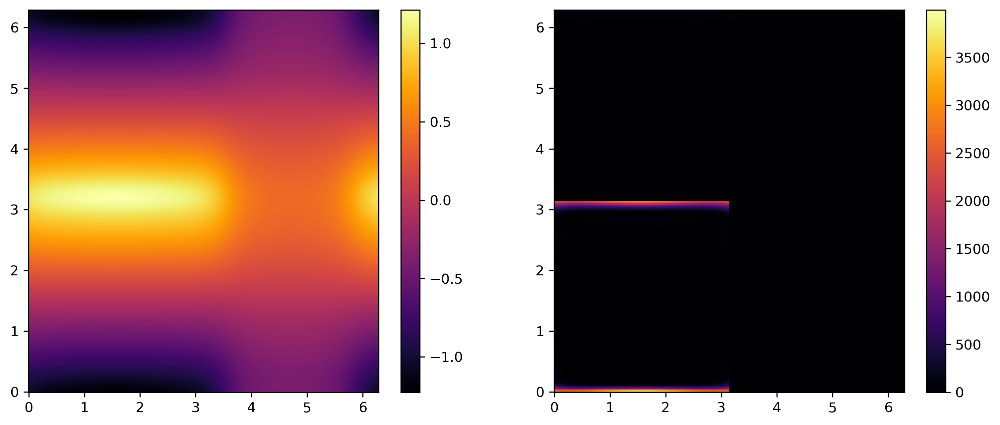

In [28]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], U2.reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], error_2.detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos2, ax=axs[1])

In [32]:
for i, x in enumerate(loaders['train']):
    areas, tri = get_areas(x)
    areas = areas.to(args['dev'])
x = x.to(args['dev'])

_, q = PDE_loss_dual(x, net_dual, A_inv, H1)
bound = compute_bound(areas, tri, q, L).detach()
bound_inv = bound[0] / (bound[0]**2 - bound[1]**2)
print(bound_inv)

np.save(f'bounds/square/A_l_VNPINN_{total_params}_{N_test}.npy', bound_inv.item())

tensor(0.6268, device='cuda:0')
